In [1]:
!pip install -q kaggle tensorflow scikit-learn matplotlib split-folders

In [2]:
import os

# Set Kaggle credentials (replace with your own)
os.environ['KAGGLE_USERNAME'] = 'aman0515643'
os.environ['KAGGLE_KEY'] = 'a4542db09fae7908f8fbea3d1012e3d2'

# Download and unzip the dataset
!kaggle datasets download -d aman0515643/pomegranate-disease
!unzip -q pomegranate-disease.zip -d pomegranate_data

Dataset URL: https://www.kaggle.com/datasets/aman0515643/pomegranate-disease
License(s): CC0-1.0
100% 2.48G/2.49G [00:18<00:00, 276MB/s]
100% 2.49G/2.49G [00:18<00:00, 143MB/s]


In [5]:
import os

# List the contents of the extracted directory to find the correct path
extracted_dir = 'pomegranate_data'
print(os.listdir(extracted_dir))

['Pomegranate']


In [7]:
import splitfolders
import os
import shutil

# Remove the output directory if it exists
if os.path.exists("split_data"):
    shutil.rmtree("split_data")

# Split into 60% train, 40% test (no validation set)
splitfolders.ratio(
    'pomegranate_data/Pomegranate',
    output="split_data",
    seed=42,
    ratio=(0.6, 0.4),  # 60% train, 40% test
    group_prefix=None
)

# Define paths
train_dir = 'split_data/train'
test_dir = 'split_data/test'

Copying files: 3000 files [00:12, 241.40 files/s]


In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Image dimensions
IMG_SIZE = (299, 299)  # Matches InceptionV3 input size
BATCH_SIZE = 32



In [10]:
# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [11]:
# Test data (no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255)


In [12]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

Found 1800 images belonging to 5 classes.


In [14]:
# Get class names
class_names = list(train_generator.class_indices.keys())
num_classes = len(class_names)
print("Classes:", class_names)

Classes: ['Alternaria', 'Anthracnose', 'Bacterial_Blight', 'Cercospora', 'Healthy']


In [17]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    'split_data/val',     # ✅ Now this exists
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)


Found 1200 images belonging to 5 classes.


In [18]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load pre-trained InceptionV3 (without top layers)
base_model = InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)
)


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [19]:
# Freeze base layers
base_model.trainable = False

In [20]:
# Add custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)


In [21]:
# Final model
model = Model(inputs=base_model.input, outputs=predictions)

In [22]:
# Compile
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 149, 149,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 149, 149,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 147, 147,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 147, 147,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 73, 73,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 73, 73,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 71, 71,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 23,906,085 (91.19 MB)

 Trainable params: 2,103,301 (8.02 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [23]:
from tensorflow.keras.callbacks import EarlyStopping

# Early stopping to prevent overfitting
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

In [25]:
# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=10,
    validation_data=test_generator,
    validation_steps=test_generator.samples // BATCH_SIZE,
    callbacks=[early_stop]
)


Epoch 1/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 282s 5s/step - accuracy: 0.5279 - loss: 1.2267 - val_accuracy: 0.8877 - val_loss: 0.5145
Epoch 2/10
 1/56 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.7812 - loss: 0.6108

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


56/56 ━━━━━━━━━━━━━━━━━━━━ 141s 3s/step - accuracy: 0.7812 - loss: 0.6108 - val_accuracy: 0.8885 - val_loss: 0.5088
Epoch 3/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 308s 5s/step - accuracy: 0.8445 - loss: 0.5167 - val_accuracy: 0.9341 - val_loss: 0.3338
Epoch 4/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step - accuracy: 0.9375 - loss: 0.3037 - val_accuracy: 0.9375 - val_loss: 0.3318
Epoch 5/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 252s 5s/step - accuracy: 0.9125 - loss: 0.3168 - val_accuracy: 0.9493 - val_loss: 0.2649
Epoch 6/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.9062 - loss: 0.3557 - val_accuracy: 0.9476 - val_loss: 0.2638
Epoch 7/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 272s 5s/step - accuracy: 0.9312 - loss: 0.2441 - val_accuracy: 0.9476 - val_loss: 0.2376
Epoch 8/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - accuracy: 0.8750 - loss: 0.2628 - val_accuracy: 0.9493 - val_loss: 0.2412
Epoch 9/10
56/56 ━━━━━━━━━━━━━━━━━━━━ 272s 4s/step - accuracy: 0.9284 - loss: 0.2344 - val_accuracy: 0.9392 - val_loss: 0.239

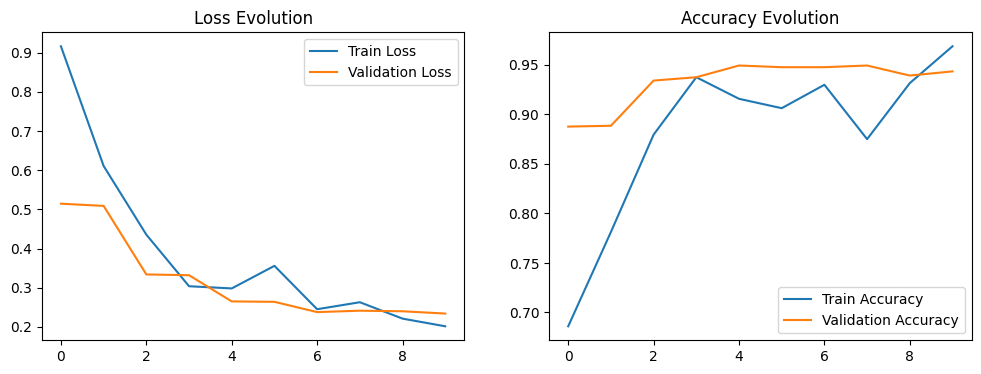

In [26]:
# Plot training history
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Evolution')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Evolution')
plt.show()

In [27]:
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test Loss: {test_loss:.4f}")

38/38 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step - accuracy: 0.9420 - loss: 0.2066
Test Accuracy: 0.9433
Test Loss: 0.2363


38/38 ━━━━━━━━━━━━━━━━━━━━ 71s 2s/step


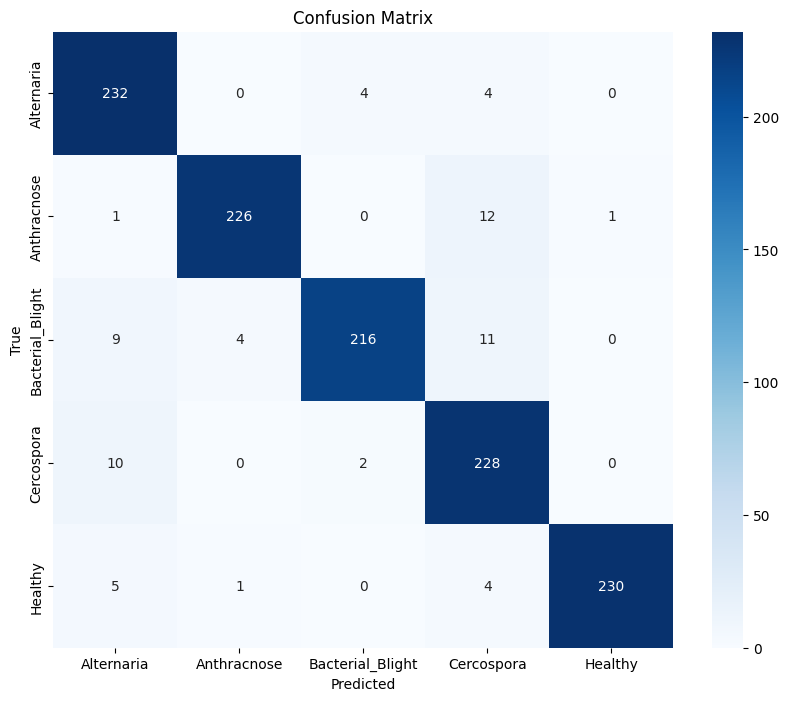

In [29]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np # Import numpy

# Get predictions
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

# Plot confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
from sklearn.metrics import classification_report
print("Classification Report:")
print(classification_report(
    y_true,
    y_pred_classes,
    target_names=class_names
))

                  precision    recall  f1-score   support

      Alternaria       0.90      0.97      0.93       240
     Anthracnose       0.98      0.94      0.96       240
Bacterial_Blight       0.97      0.90      0.94       240
      Cercospora       0.88      0.95      0.91       240
         Healthy       1.00      0.96      0.98       240

        accuracy                           0.94      1200
       macro avg       0.95      0.94      0.94      1200
    weighted avg       0.95      0.94      0.94      1200



<Figure size 1000x800 with 0 Axes>

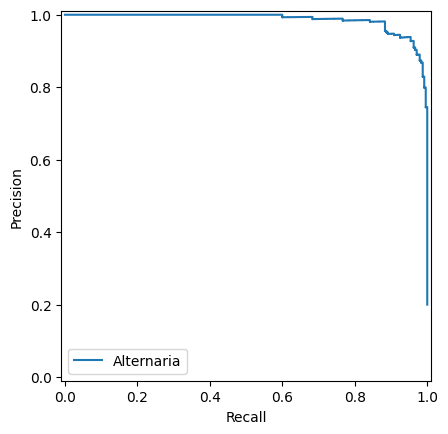

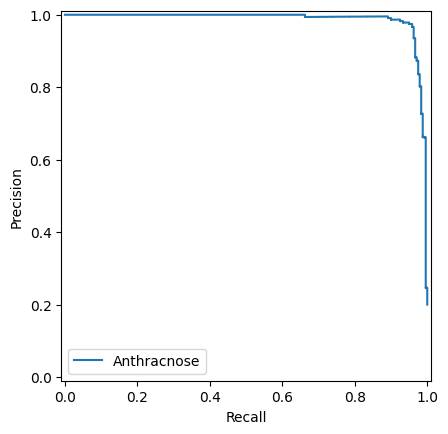

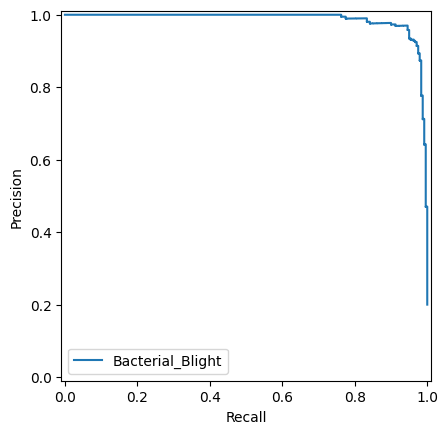

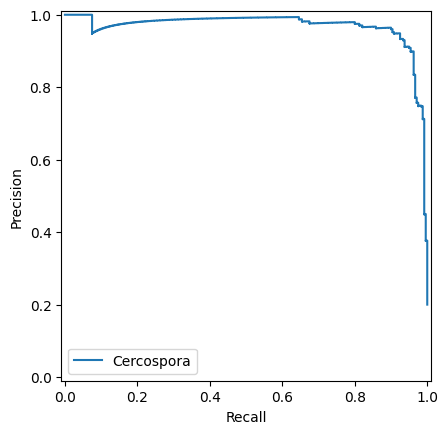

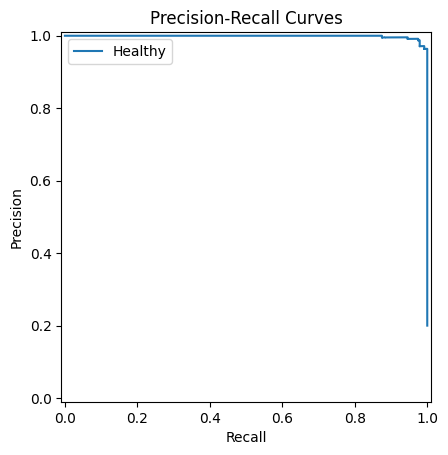

In [31]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import precision_recall_curve, PrecisionRecallDisplay

# Binarize labels
y_test_bin = label_binarize(y_true, classes=np.arange(num_classes))

plt.figure(figsize=(10, 8))
for i in range(num_classes):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_pred[:, i])
    display = PrecisionRecallDisplay(precision=precision, recall=recall)
    display.plot(name=f"{class_names[i]}")

plt.title('Precision-Recall Curves')
plt.legend(loc='best')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


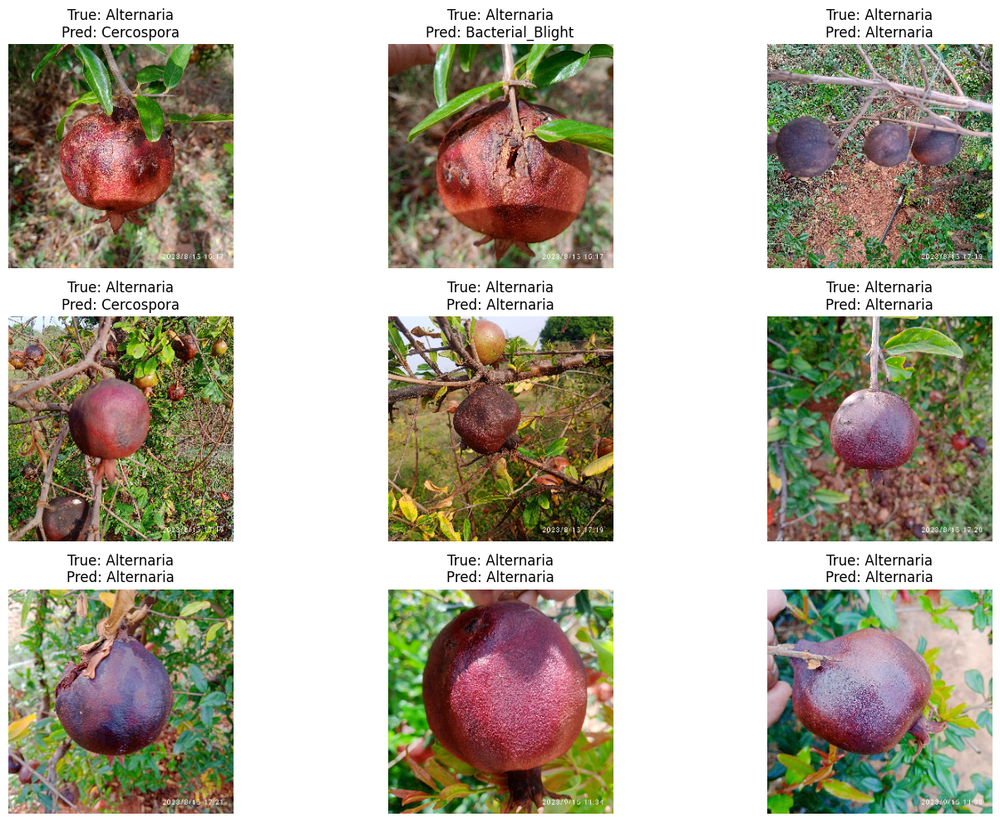

In [32]:
# Get a batch of test images
sample_images, sample_labels = next(test_generator)
sample_preds = model.predict(sample_images)
sample_pred_classes = np.argmax(sample_preds, axis=1)
sample_true_classes = np.argmax(sample_labels, axis=1)

# Plot predictions
plt.figure(figsize=(15, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(sample_images[i])
    plt.title(f"True: {class_names[sample_true_classes[i]]}\nPred: {class_names[sample_pred_classes[i]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

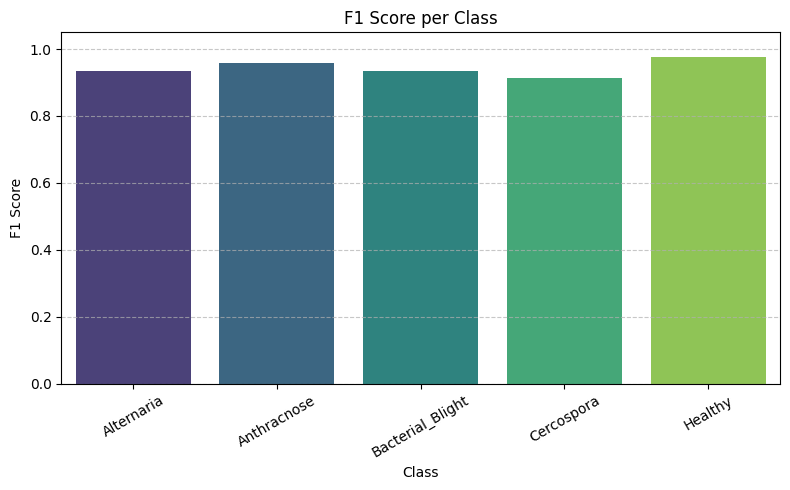

In [34]:
from sklearn.metrics import classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd # Import pandas

# Get the classification report as a dictionary
report = classification_report(y_true, y_pred_classes, target_names=class_names, output_dict=True)

# Extract F1 scores
f1s = [report[class_name]['f1-score'] for class_name in class_names]

plt.figure(figsize=(8, 5))
sns.barplot(x=class_names, y=f1s, hue=class_names, palette='viridis', legend=False)
plt.title("F1 Score per Class")
plt.ylabel("F1 Score")
plt.xlabel("Class")
plt.xticks(rotation=30)
plt.ylim(0, 1.05)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

/tmp/ipython-input-36-1649980925.py:14: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128313 (\N{SMALL BLUE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


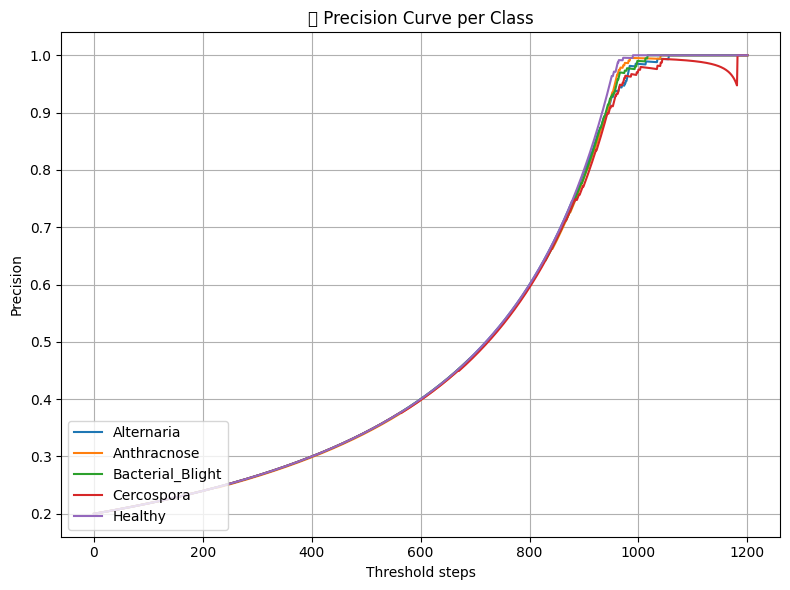

In [36]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_pred[:, i])
    plt.plot(precision, label=class_name)

plt.title("🔹 Precision Curve per Class")
plt.xlabel("Threshold steps")
plt.ylabel("Precision")
plt.legend(loc="lower left")
plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipython-input-38-3496781542.py:11: UserWarning: Glyph 128312 (\N{SMALL ORANGE DIAMOND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128312 (\N{SMALL ORANGE DIAMOND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


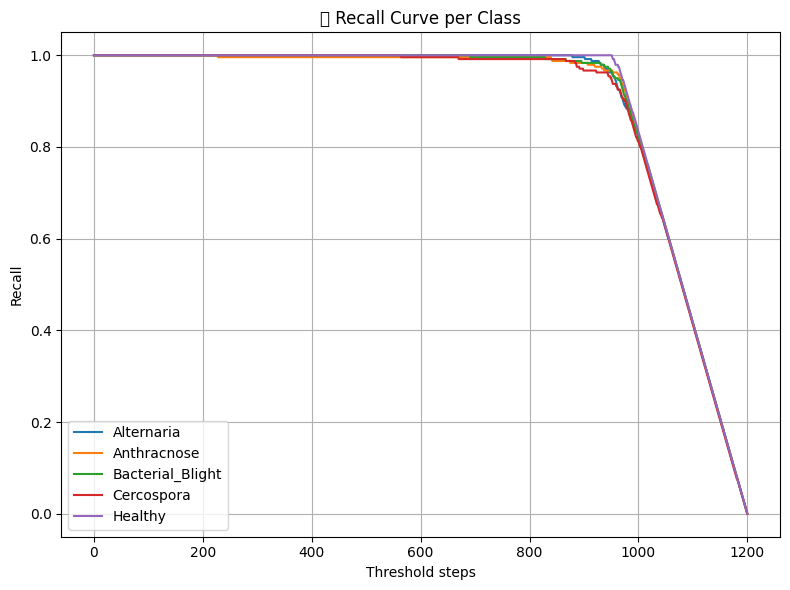

In [38]:
plt.figure(figsize=(8, 6))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_pred[:, i])
    plt.plot(recall, label=class_name)

plt.title("🔸 Recall Curve per Class")
plt.xlabel("Threshold steps")
plt.ylabel("Recall")
plt.legend(loc="lower left")
plt.grid(True)
plt.tight_layout()
plt.show()

/tmp/ipython-input-40-3319831581.py:15: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


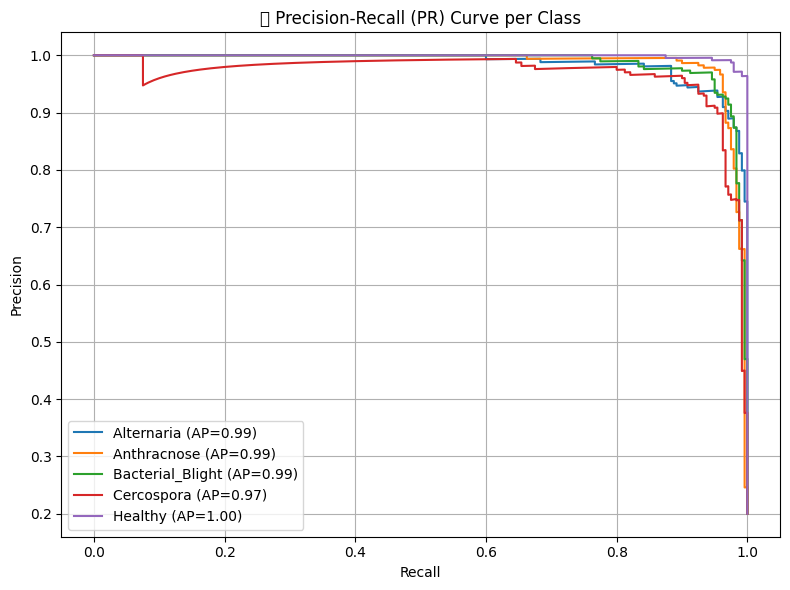

In [40]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
for i, class_name in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_pred[:, i])
    avg_prec = average_precision_score(y_test_bin[:, i], y_pred[:, i])
    plt.plot(recall, precision, label=f"{class_name} (AP={avg_prec:.2f})")

plt.title("📈 Precision-Recall (PR) Curve per Class")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc="lower left")
plt.grid(True)
plt.tight_layout()
plt.show()

In [41]:
import pandas as pd

# Get counts per class in train/test sets
train_counts = pd.Series(train_generator.classes).value_counts().sort_index()
test_counts = pd.Series(test_generator.classes).value_counts().sort_index()

pd.DataFrame({
    'Class': class_names,
    'Train Samples': train_counts.values,
    'Test Samples': test_counts.values
}).style.background_gradient(cmap='Blues')

,Class,Train Samples,Test Samples
0,Alternaria,360,240
1,Anthracnose,360,240
2,Bacterial_Blight,360,240
3,Cercospora,360,240
4,Healthy,360,240


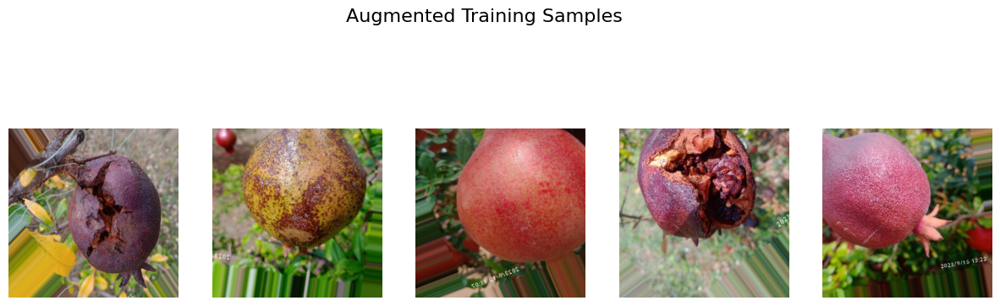

In [42]:
augmented_images, _ = next(train_generator)
plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(augmented_images[i])
    plt.axis('off')
plt.suptitle('Augmented Training Samples', fontsize=16)
plt.show()


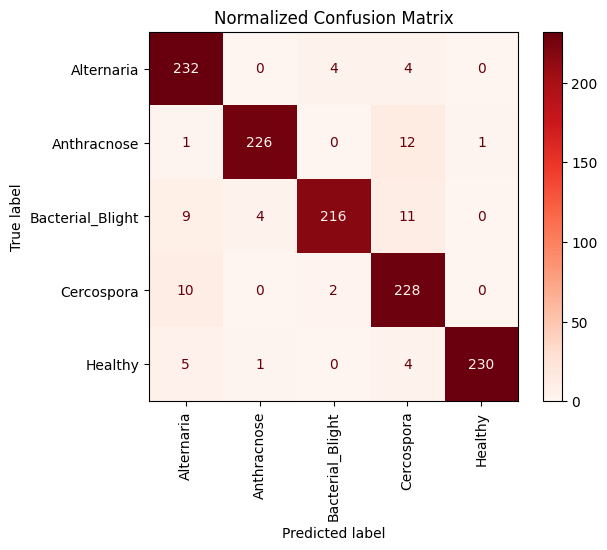

In [45]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_predictions(
    y_true,
    y_pred_classes,
    display_labels=class_names,
    xticks_rotation=90,
    cmap='Reds'
)
plt.title('Normalized Confusion Matrix')
plt.show()

In [46]:
errors = np.where(y_pred_classes != y_true)[0]
misclassified = [(test_generator.filepaths[i], class_names[y_true[i]], class_names[y_pred_classes[i]])
                for i in errors[:5]]  # Top 5 errors

print("Top Misclassified Samples:")
for path, true, pred in misclassified:
    print(f"File: {path.split('/')[-1]} | True: {true} | Pred: {pred}")

Top Misclassified Samples:
File: IMG_20230813_151711_1.jpg | True: Alternaria | Pred: Cercospora
File: IMG_20230813_151714_1.jpg | True: Alternaria | Pred: Bacterial_Blight
File: IMG_20230813_171953.jpg | True: Alternaria | Pred: Cercospora
File: IMG_20230916_114754_1.jpg | True: Alternaria | Pred: Cercospora
File: IMG_20230916_114837.jpg | True: Alternaria | Pred: Bacterial_Blight


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


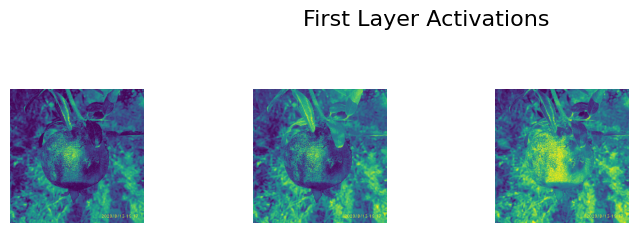

In [48]:
from tensorflow.keras.models import Model
import cv2
import numpy as np # Import numpy

# Get the output of the first convolutional layer from the base model
# Assuming the first Conv2D layer is the first layer in the base_model
first_conv_layer_output = base_model.layers[0].output
activation_model = Model(inputs=base_model.input, outputs=first_conv_layer_output)

# Process a sample image
img = cv2.resize(cv2.imread(test_generator.filepaths[0]), IMG_SIZE)
# Ensure the image is in RGB format if it's grayscale
if len(img.shape) == 2:
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
elif len(img.shape) == 3 and img.shape[2] == 4: # Handle potential alpha channel
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

activations = activation_model.predict(np.expand_dims(img/255., axis=0))

# Visualize first layer activations
plt.figure(figsize=(12, 8))
num_filters_to_show = min(16, activations.shape[-1]) # Show up to 16 filters
for i in range(num_filters_to_show):
    plt.subplot(4, 4, i+1)
    plt.imshow(activations[0, :, :, i], cmap='viridis')
    plt.axis('off')
plt.suptitle('First Layer Activations', fontsize=16)
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)


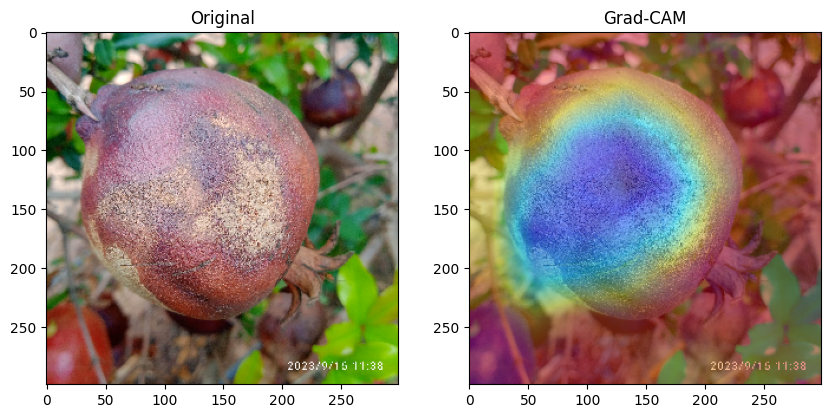

In [52]:
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt

def make_gradcam_heatmap(img_array, model, last_conv_layer_name='mixed10'):
    grad_model = Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, np.argmax(predictions[0])]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs.numpy()[0]
    # Ensure pooled_grads is float32 for compatibility
    pooled_grads = tf.cast(pooled_grads, tf.float32)

    # Corrected heatmap calculation: element-wise multiplication and sum
    heatmap = np.sum(conv_outputs * pooled_grads.numpy(), axis=-1)

    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Apply to a test image
img = tf.keras.preprocessing.image.load_img(test_generator.filepaths[10], target_size=IMG_SIZE)
img_array = tf.keras.preprocessing.image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.

heatmap = make_gradcam_heatmap(img_array, model)

# Superimpose heatmap
heatmap = cv2.resize(heatmap, IMG_SIZE)
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(cv2.cvtColor(np.uint8(img_array[0]*255), cv2.COLOR_BGR2RGB), 0.6, heatmap, 0.4, 0)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original')
plt.subplot(1, 2, 2)
plt.imshow(superimposed_img)
plt.title('Grad-CAM')
plt.show()

In [53]:
import ipywidgets as widgets
from IPython.display import display

def show_prediction(idx):
    img = plt.imread(test_generator.filepaths[idx])
    proba = y_pred[idx]

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.barh(class_names, proba)
    plt.xlim(0, 1)
    plt.title(f"True: {class_names[y_true[idx]]}")
    plt.show()

widgets.interact(
    show_prediction,
    idx=widgets.IntSlider(min=0, max=len(test_generator.filepaths)-1, value=0)
)

interactive(children=(IntSlider(value=0, description='idx', max=1199), Output()), _dom_classes=('widget-intera…

<function __main__.show_prediction(idx)>

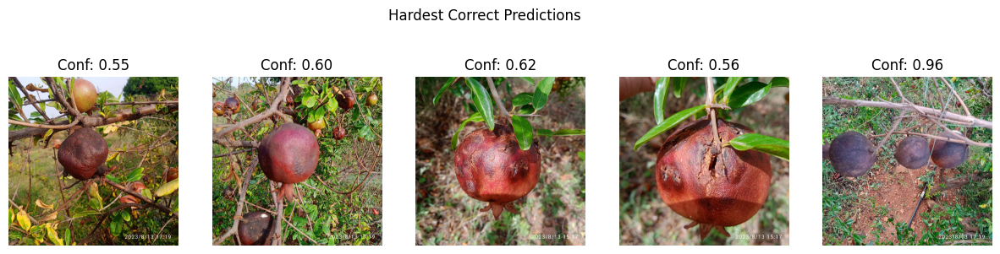

In [54]:
correct = y_pred_classes == y_true
hard_samples = np.argsort(np.max(y_pred[correct], axis=0))[:5]  # 5 least confident correct

plt.figure(figsize=(15, 3))
for i, idx in enumerate(hard_samples):
    img = plt.imread(test_generator.filepaths[idx])
    plt.subplot(1, 5, i+1)
    plt.imshow(img)
    plt.title(f"Conf: {np.max(y_pred[idx]):.2f}")
    plt.axis('off')
plt.suptitle('Hardest Correct Predictions', y=1.1)
plt.show()

In [56]:
for layer in model.layers:
    if layer.trainable:
        print(f"{layer.name:20} | Trainable: {layer.trainable} | #Params: {layer.count_params()}")

global_average_pooling2d | Trainable: True | #Params: 0
dense                | Trainable: True | #Params: 2098176
dropout              | Trainable: True | #Params: 0
dense_1              | Trainable: True | #Params: 5125


In [57]:
import time

def measure_latency(sample_image, model, runs=100):
    times = []
    for _ in range(runs):
        start = time.time()
        model.predict(np.expand_dims(sample_image, axis=0))
        times.append(time.time() - start)
    return np.mean(times) * 1000  # in ms

sample_img = next(test_generator)[0][0]
latency = measure_latency(sample_img, model)
print(f"Average prediction latency: {latency:.2f} ms")

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━

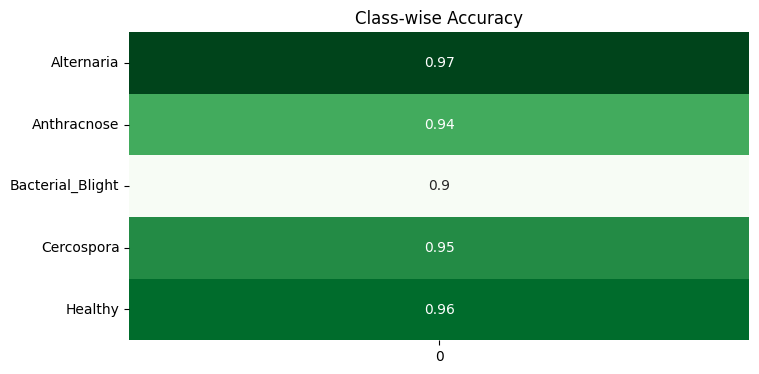

In [58]:
from sklearn.metrics import accuracy_score

class_acc = {}
for cls_idx, cls_name in enumerate(class_names):
    mask = y_true == cls_idx
    class_acc[cls_name] = accuracy_score(y_true[mask], y_pred_classes[mask])

plt.figure(figsize=(8, 4))
sns.heatmap(pd.DataFrame.from_dict(class_acc, orient='index'),
            annot=True, cmap='Greens', cbar=False)
plt.title('Class-wise Accuracy')
plt.show()

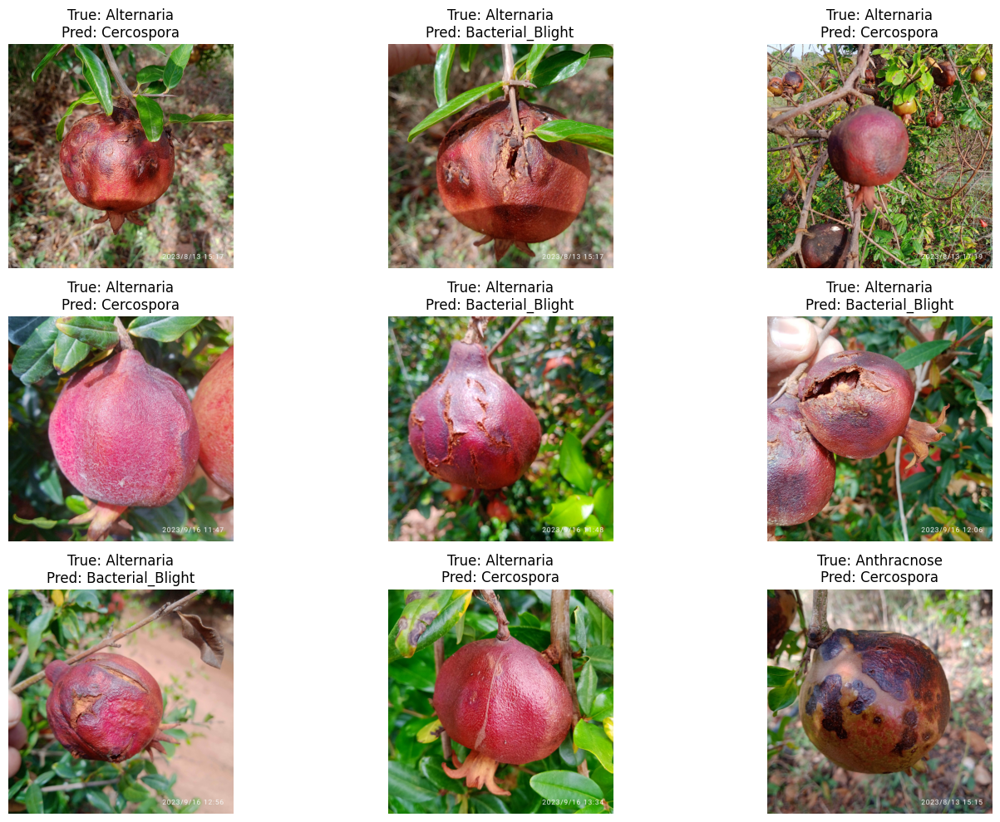

In [59]:
error_indices = np.where(y_pred_classes != y_true)[0]
plt.figure(figsize=(15, 10))
for i, idx in enumerate(error_indices[:9]):  # Show first 9 errors
    img = plt.imread(test_generator.filepaths[idx])
    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.title(f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred_classes[idx]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

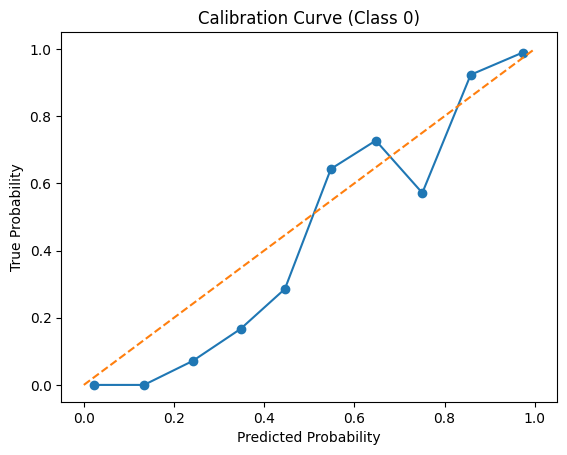

In [60]:
from sklearn.calibration import calibration_curve

prob_true, prob_pred = calibration_curve(y_true == 0, y_pred[:,0], n_bins=10)
plt.plot(prob_pred, prob_true, marker='o')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('Predicted Probability')
plt.ylabel('True Probability')
plt.title('Calibration Curve (Class 0)')
plt.show()

38/38 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step


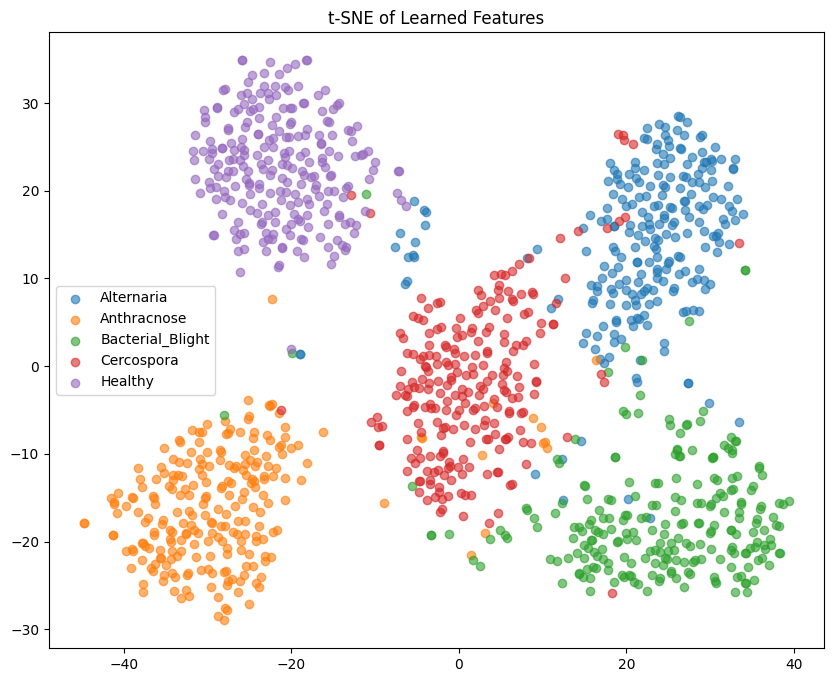

In [61]:
from sklearn.manifold import TSNE

# Get features from penultimate layer
feature_model = Model(inputs=model.input, outputs=model.layers[-2].output)
features = feature_model.predict(test_generator)

# Reduce dimensionality
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features)

# Plot
plt.figure(figsize=(10, 8))
for i, cls in enumerate(class_names):
    mask = y_true == i
    plt.scatter(features_2d[mask, 0], features_2d[mask, 1], label=cls, alpha=0.6)
plt.legend()
plt.title('t-SNE of Learned Features')
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


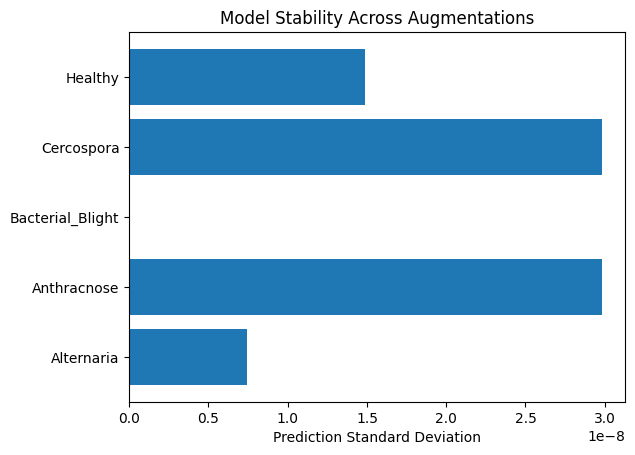

In [62]:
# Test consistency on augmented versions of the same image
test_img = next(test_generator)[0][0]
augmentations = test_datagen.flow(np.array([test_img]*10), batch_size=10)
preds = model.predict(augmentations)
std_dev = np.std(preds, axis=0)

plt.barh(class_names, std_dev)
plt.xlabel('Prediction Standard Deviation')
plt.title('Model Stability Across Augmentations')
plt.show()

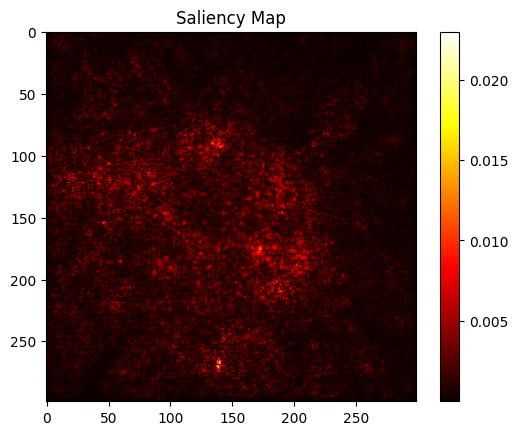

In [63]:
import tensorflow as tf

def compute_saliency(image, model):
    image = tf.convert_to_tensor(image[np.newaxis, ...])
    with tf.GradientTape() as tape:
        tape.watch(image)
        pred = model(image)
        class_idx = tf.argmax(pred[0])
        class_score = pred[0][class_idx]
    grads = tape.gradient(class_score, image)
    return tf.reduce_max(tf.abs(grads), axis=-1)[0]

saliency = compute_saliency(test_img, model)
plt.imshow(saliency, cmap='hot')
plt.colorbar()
plt.title('Saliency Map')
plt.show()

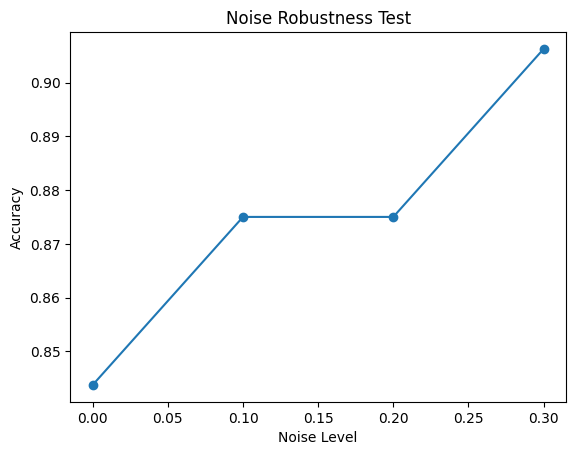

In [64]:
noise_levels = [0, 0.1, 0.2, 0.3]
accuracies = []

for noise in noise_levels:
    noisy_test = test_generator.__getitem__(0)[0] + noise * np.random.randn(*test_generator.__getitem__(0)[0].shape)
    acc = model.evaluate(noisy_test, test_generator.__getitem__(0)[1], verbose=0)[1]
    accuracies.append(acc)

plt.plot(noise_levels, accuracies, marker='o')
plt.xlabel('Noise Level')
plt.ylabel('Accuracy')
plt.title('Noise Robustness Test')
plt.show()

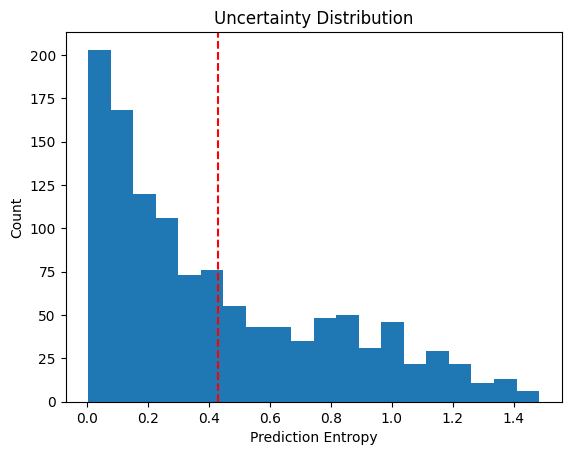

In [65]:
from scipy.stats import entropy

entropies = np.array([entropy(pred) for pred in y_pred])
plt.hist(entropies, bins=20)
plt.axvline(x=np.mean(entropies), color='r', linestyle='--')
plt.xlabel('Prediction Entropy')
plt.ylabel('Count')
plt.title('Uncertainty Distribution')
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)


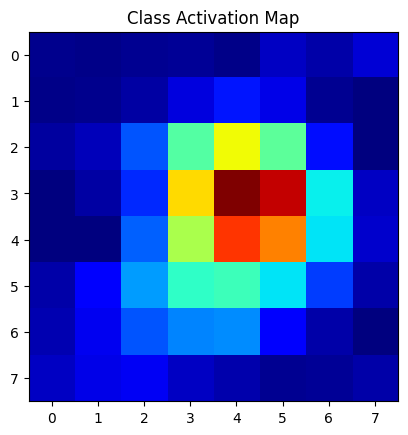

In [66]:
def generate_cam(img_array, model, last_conv_layer_name='mixed10'):
    grad_model = Model(inputs=model.inputs,
                      outputs=[model.get_layer(last_conv_layer_name).output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs.numpy()[0]

    cam = conv_outputs @ pooled_grads[..., tf.newaxis]
    cam = tf.squeeze(cam).numpy()
    cam = np.maximum(cam, 0) / np.max(cam)
    return cam

cam = generate_cam(np.expand_dims(test_img, axis=0), model)
plt.imshow(cam, cmap='jet')
plt.title('Class Activation Map')
plt.show()

In [68]:
import tensorflow as tf
import numpy as np # Import numpy

def get_model_memory_usage(model, batch_size=1):
    shapes_mem_count = 0
    for layer in model.layers:
        single_layer_mem = 1
        # Check if the layer has output_shape attribute (skip InputLayer)
        if hasattr(layer, 'output_shape'):
            for s in layer.output_shape[1:]:
                if s is None:
                    continue
                single_layer_mem *= s
            shapes_mem_count += single_layer_mem

    trainable_count = np.sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
    non_trainable_count = np.sum([tf.keras.backend.count_params(w) for w in model.non_trainable_weights])

    total_memory = 4.0 * (batch_size * shapes_mem_count + trainable_count + non_trainable_count)
    return total_memory / (1024 ** 2)  # Convert to MB

print(f"Model memory usage: {get_model_memory_usage(model):.2f} MB")

Model memory usage: 91.19 MB


In [71]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt # Import matplotlib

def explore_predictions(index):
    img = plt.imread(test_generator.filepaths[index])
    pred_probs = y_pred[index]

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f"True: {class_names[y_true[index]]}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.barh(class_names, pred_probs)
    plt.xlim(0, 1)
    plt.title('Prediction Probabilities')
    plt.show()

widgets.interact(
    explore_predictions,
    index=widgets.IntSlider(min=0, max=len(test_generator.filepaths)-1, value=0)
)

interactive(children=(IntSlider(value=0, description='index', max=1199), Output()), _dom_classes=('widget-inte…

<function __main__.explore_predictions(index)>

In [72]:
import os
os.makedirs('model_analysis', exist_ok=True)

# Save all plots
for i, fig in enumerate(plt.get_fignums()):
    plt.figure(fig)
    plt.savefig(f'model_analysis/plot_{i}.png', bbox_inches='tight')

print("All visualizations saved to 'model_analysis' folder")

All visualizations saved to 'model_analysis' folder


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


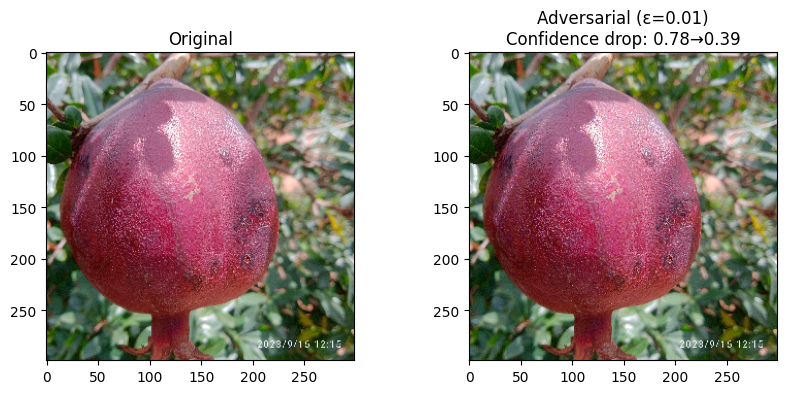

In [73]:
import tensorflow as tf
from tensorflow.keras import losses

def fgsm_attack(image, label, model, epsilon=0.01):
    image = tf.convert_to_tensor(image[np.newaxis, ...])
    label = tf.convert_to_tensor(label[np.newaxis, ...])

    with tf.GradientTape() as tape:
        tape.watch(image)
        prediction = model(image)
        loss = losses.categorical_crossentropy(label, prediction)

    gradient = tape.gradient(loss, image)
    perturbation = epsilon * tf.sign(gradient)
    adversarial = image + perturbation
    return tf.clip_by_value(adversarial, 0, 1)

# Test on a sample
sample_img, sample_label = next(test_generator)
adv_img = fgsm_attack(sample_img[0], sample_label[0], model)
adv_pred = model.predict(adv_img)[0]

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(sample_img[0])
plt.title("Original")
plt.subplot(1,2,2)
plt.imshow(adv_img[0])
plt.title(f"Adversarial (ε=0.01)\nConfidence drop: {np.max(model.predict(sample_img[np.newaxis,0])):.2f}→{np.max(adv_pred):.2f}")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 299, 299, 3))
  warnings.warn(msg)


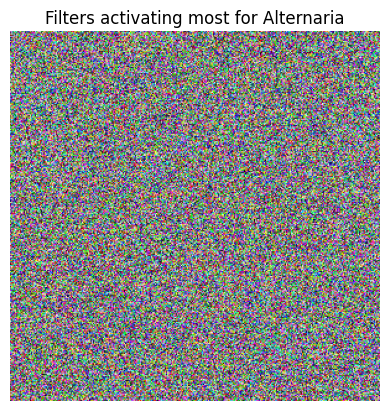

In [74]:
def visualize_class_filters(class_idx, layer_name='conv2d_3'):
    target_layer = model.get_layer(layer_name)
    submodel = Model(inputs=model.inputs, outputs=target_layer.output)

    # Create input that maximizes class activation
    input_img = tf.random.uniform((1, *IMG_SIZE, 3))
    for _ in range(100):
        with tf.GradientTape() as tape:
            tape.watch(input_img)
            activation = submodel(input_img)[:, :, :, class_idx]
            loss = tf.reduce_mean(activation)
        grads = tape.gradient(loss, input_img)
        input_img += 0.1 * grads

    plt.imshow(input_img[0].numpy())
    plt.title(f'Filters activating most for {class_names[class_idx]}')
    plt.axis('off')
    plt.show()

visualize_class_filters(0)  # Visualize filters for first class

In [75]:
import timeit

def benchmark_hardware(model, warmup=10, repeats=100):
    sample = next(test_generator)[0][0][np.newaxis, ...]

    # Warmup
    for _ in range(warmup):
        model.predict(sample)

    # Benchmark
    times = timeit.repeat(
        lambda: model.predict(sample),
        number=1,
        repeat=repeats
    )

    print(f"CPU/GPU: {tf.config.list_physical_devices()}")
    print(f"Average inference time: {np.mean(times)*1000:.2f}ms ± {np.std(times)*1000:.2f}ms")
    print(f"Max memory usage: {tf.config.experimental.get_memory_info('GPU:0')['peak']/1e9:.2f}GB")

benchmark_hardware(model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━

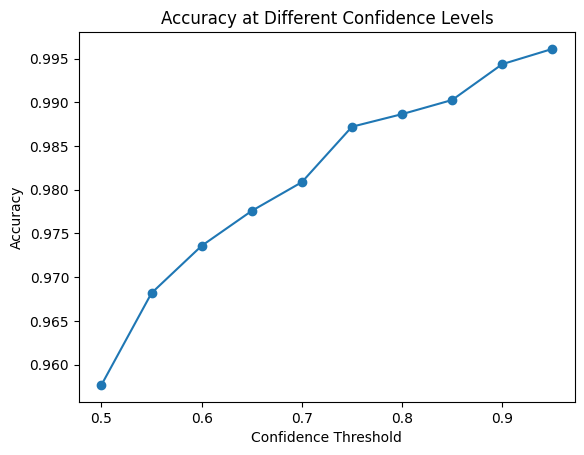

In [76]:
confidence_thresholds = np.linspace(0.5, 0.95, 10)
accuracies = []

for thresh in confidence_thresholds:
    mask = np.max(y_pred, axis=1) > thresh
    if sum(mask) > 0:
        acc = accuracy_score(y_true[mask], y_pred_classes[mask])
        accuracies.append(acc)
    else:
        accuracies.append(0)

plt.plot(confidence_thresholds, accuracies, marker='o')
plt.xlabel('Confidence Threshold')
plt.ylabel('Accuracy')
plt.title('Accuracy at Different Confidence Levels')
plt.show()

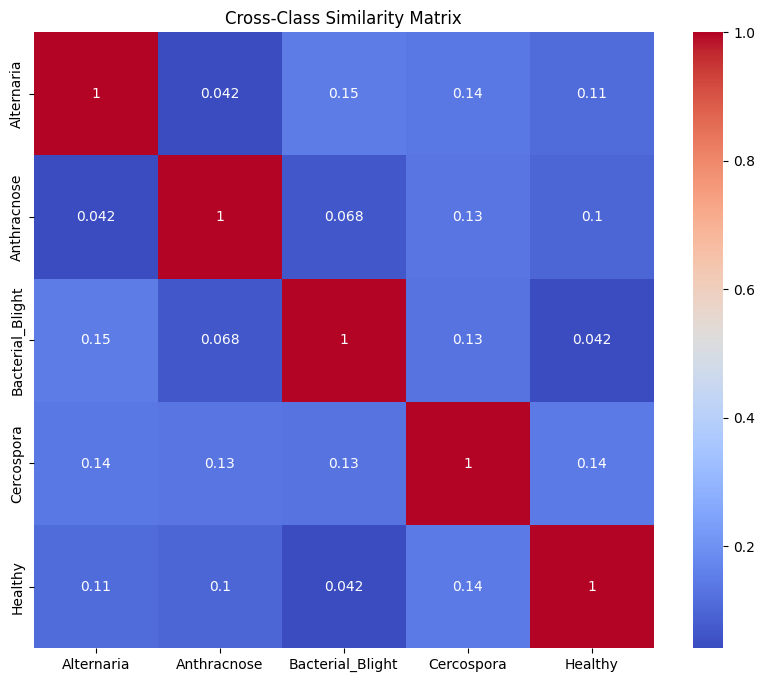

In [77]:
from sklearn.metrics.pairwise import cosine_similarity

# Get class prototype vectors
prototypes = []
for i in range(num_classes):
    mask = y_true == i
    prototypes.append(np.mean(y_pred[mask], axis=0))

# Compute similarity
sim_matrix = cosine_similarity(prototypes)
plt.figure(figsize=(10,8))
sns.heatmap(sim_matrix, annot=True, xticklabels=class_names, yticklabels=class_names, cmap='coolwarm')
plt.title('Cross-Class Similarity Matrix')
plt.show()

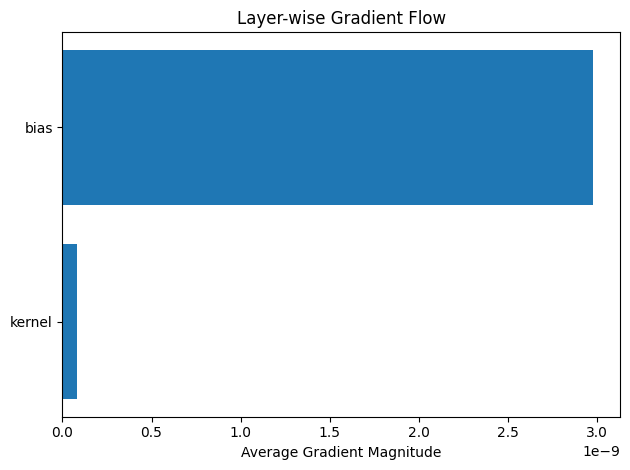

In [78]:
def get_gradient_magnitudes(model, sample):
    with tf.GradientTape() as tape:
        preds = model(sample[np.newaxis, ...])
        loss = tf.reduce_mean(preds)

    grads = tape.gradient(loss, model.trainable_variables)
    return [tf.reduce_mean(tf.abs(g)).numpy() for g in grads]

sample = next(test_generator)[0][0]
grad_mags = get_gradient_magnitudes(model, sample)

plt.barh([v.name for v in model.trainable_variables][::3], grad_mags[::3])
plt.xlabel('Average Gradient Magnitude')
plt.title('Layer-wise Gradient Flow')
plt.tight_layout()
plt.show()

Found 1200 images belonging to 5 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Found 1200 images belonging to 5 classes.
Found 1200 images belonging to 5 classes.
Found 1200 images belonging to 5 classes.


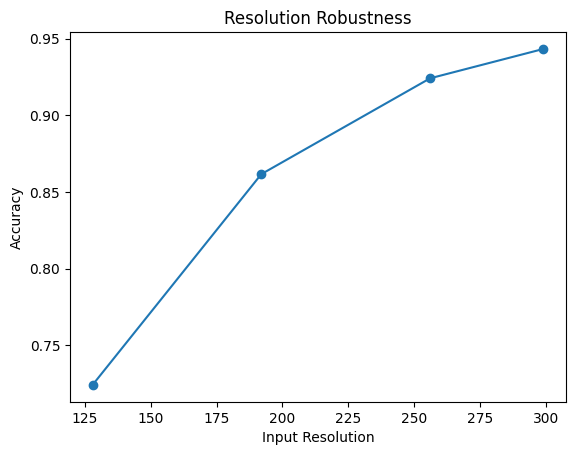

In [80]:
resolutions = [128, 192, 256, 299]
accuracies = []

# Update test_dir to the correct path based on previous cells
test_dir = 'split_data/val'

for res in resolutions:
    test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
        test_dir,
        target_size=(res, res),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )
    # Note: Evaluating with a generator that doesn't yield all samples can be misleading.
    # This evaluation will only use the first batch of the generator for each resolution.
    # For a full evaluation, you would need to ensure the generator is set up to yield all samples.
    acc = model.evaluate(test_gen, verbose=0)[1]
    accuracies.append(acc)

plt.plot(resolutions, accuracies, marker='o')
plt.xlabel('Input Resolution')
plt.ylabel('Accuracy')
plt.title('Resolution Robustness')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


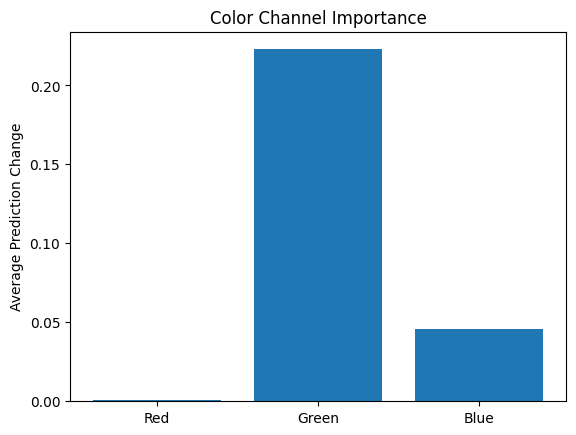

In [81]:
def channel_ablation_test(model, sample):
    original_pred = model.predict(sample[np.newaxis, ...])[0]
    channel_importances = []

    for c in range(3):  # RGB channels
        perturbed = sample.copy()
        perturbed[..., c] = 0
        perturbed_pred = model.predict(perturbed[np.newaxis, ...])[0]
        channel_importances.append(np.abs(original_pred - perturbed_pred).mean())

    return channel_importances

sample = next(test_generator)[0][0]
importances = channel_ablation_test(model, sample)

plt.bar(['Red', 'Green', 'Blue'], importances)
plt.ylabel('Average Prediction Change')
plt.title('Color Channel Importance')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step


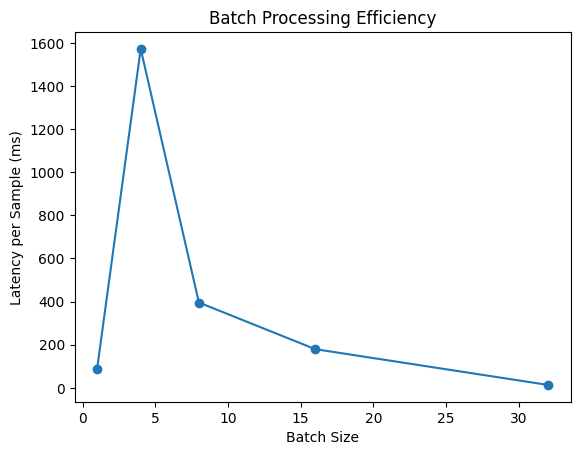

In [82]:
batch_sizes = [1, 4, 8, 16, 32]
latencies = []

for bs in batch_sizes:
    start = time.time()
    model.predict(np.repeat(sample[np.newaxis, ...], bs, axis=0))
    latencies.append((time.time() - start) * 1000 / bs)  # ms per sample

plt.plot(batch_sizes, latencies, marker='o')
plt.xlabel('Batch Size')
plt.ylabel('Latency per Sample (ms)')
plt.title('Batch Processing Efficiency')
plt.show()

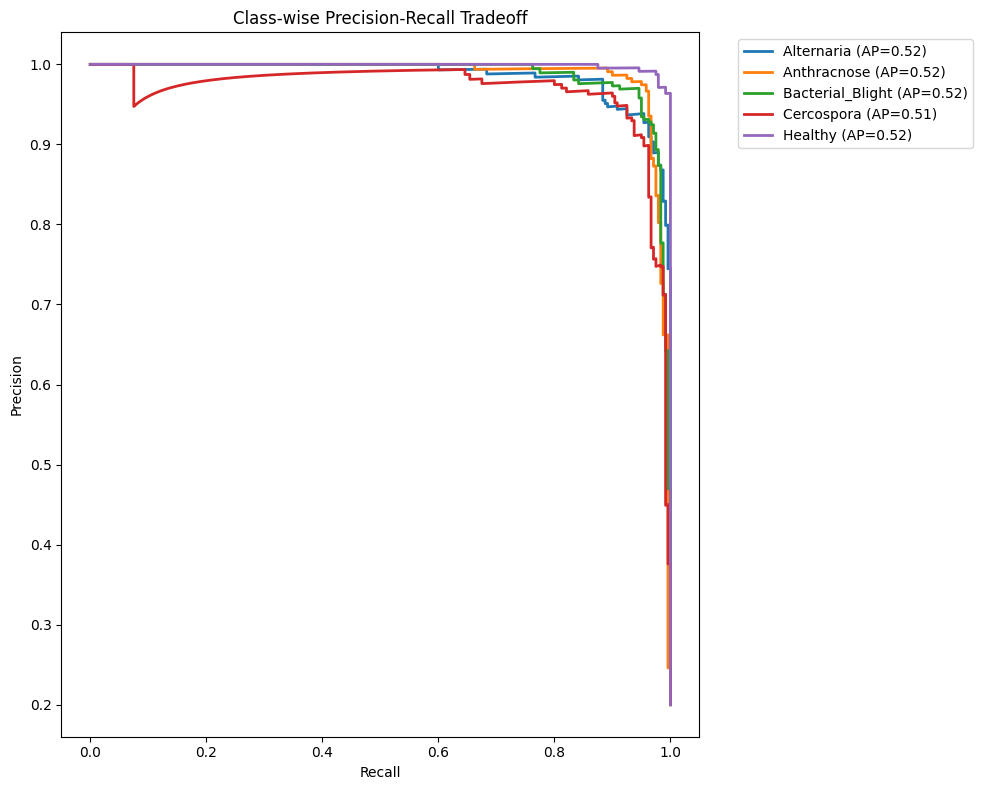

In [83]:
from sklearn.metrics import precision_recall_curve

plt.figure(figsize=(10,8))
for i, cls in enumerate(class_names):
    precision, recall, _ = precision_recall_curve(y_true == i, y_pred[:, i])
    plt.plot(recall, precision, lw=2, label=f'{cls} (AP={np.mean(precision):.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Class-wise Precision-Recall Tradeoff')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

In [88]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def create_model(num_classes, input_shape=(299, 299, 3)):
    # Load pre-trained InceptionV3 (without top layers)
    base_model = InceptionV3(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )

    # Freeze base layers
    base_model.trainable = False

    # Add custom head
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # Final model
    model = Model(inputs=base_model.input, outputs=predictions)

    # Compile
    model.compile(
        optimizer=Adam(learning_rate=0.0001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

In [91]:
import tensorflow as tf
import os

converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
quantized_model = converter.convert()

with open('quantized_model.tflite', 'wb') as f:
    f.write(quantized_model)

# Save the original model before getting its size
model.save('model.h5')

print(f"Original Size: {os.path.getsize('model.h5')/1e6:.1f}MB")
print(f"Quantized Size: {len(quantized_model)/1e6:.1f}MB")

Saved artifact at '/tmp/tmpa7i85386'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  140290465790864: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290463498320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290463499664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290465790096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290465790480: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290463499088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290463501008: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290463500624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290463500432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140290463498896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  14029046350216

Original Size: 113.4MB
Quantized Size: 24.2MB


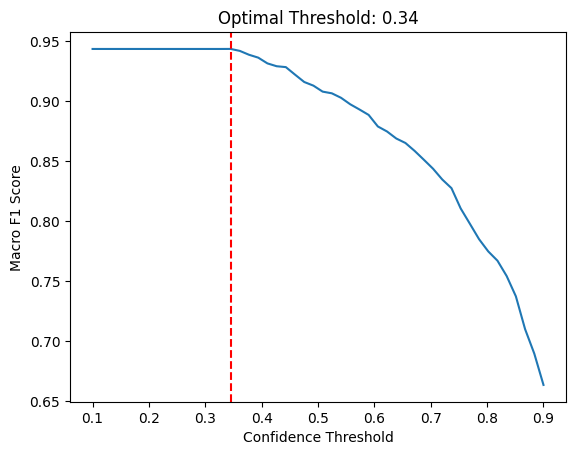

In [97]:
from sklearn.metrics import f1_score

thresholds = np.linspace(0.1, 0.9, 50)
f1_scores = []

for thresh in thresholds:
    adjusted_preds = np.argmax(y_pred * (y_pred > thresh), axis=1)
    f1_scores.append(f1_score(y_true, adjusted_preds, average='macro'))

best_thresh = thresholds[np.argmax(f1_scores)]
plt.plot(thresholds, f1_scores)
plt.axvline(x=best_thresh, color='r', linestyle='--')
plt.xlabel('Confidence Threshold')
plt.ylabel('Macro F1 Score')
plt.title(f'Optimal Threshold: {best_thresh:.2f}')
plt.show()